<a href="https://colab.research.google.com/github/PaulToronto/Applied-Geospatial-Data-Science-with-Python---Book/blob/main/2_3_Contextily_Warping_Tiles.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Contextily Warping Tiles

## Imports

In [1]:
!pip install contextily

In [2]:
!pip install geodatasets

In [3]:
import geopandas as gpd
from geodatasets import get_path

import numpy as np

import contextily as cx
import rasterio as rio

import matplotlib.pyplot as plt
from rasterio.plot import show as rioshow

In [4]:
from google.colab import drive

drive.mount('/content/gdrive')

drive_path = '/content/gdrive/MyDrive/Colab Notebooks/Data Science/Applied Geospatial Data Science with Python - Book/data/'

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Warping

- most basemap tiles provided through the web are expressed in the **Web Mercator coordinate reference system**: `EPSG:3857`
- when our data is not expressed in the same CRS we have two options:
    1. reproject our data to Web Mercator
    2. reproject or **warp** the tiles to conform with our data
- it might be very "costly" to reproject your own data, in that case, warping the tiles is the best option

## The Data

In [5]:
db = gpd.read_file(get_path('nybb'))

In [6]:
db.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   BoroCode    5 non-null      int64   
 1   BoroName    5 non-null      object  
 2   Shape_Leng  5 non-null      float64 
 3   Shape_Area  5 non-null      float64 
 4   geometry    5 non-null      geometry
dtypes: float64(2), geometry(1), int64(1), object(1)
memory usage: 328.0+ bytes


In [7]:
db.head()

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


In [8]:
db.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

## Option 1: Convert your data to Web Mercator

In [9]:
db

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((970217.022 145643.332, 970227...."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((1029606.077 156073.814, 102957..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((1021176.479 151374.797, 102100..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((981219.056 188655.316, 980940...."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((1012821.806 229228.265, 101278..."


In [10]:
db_wm = db.to_crs(epsg=3857)
db_wm

,BoroCode,BoroName,Shape_Leng,Shape_Area,geometry
0,5,Staten Island,330470.010332,1.623820e+09,"MULTIPOLYGON (((-8243264.851 4948597.836, -824..."
1,4,Queens,896344.047763,3.045213e+09,"MULTIPOLYGON (((-8219461.925 4952778.732, -821..."
2,3,Brooklyn,741080.523166,1.937479e+09,"MULTIPOLYGON (((-8222843.672 4950893.793, -822..."
3,1,Manhattan,359299.096471,6.364715e+08,"MULTIPOLYGON (((-8238858.864 4965915.024, -823..."
4,2,Bronx,464392.991824,1.186925e+09,"MULTIPOLYGON (((-8226155.130 4982269.949, -822..."


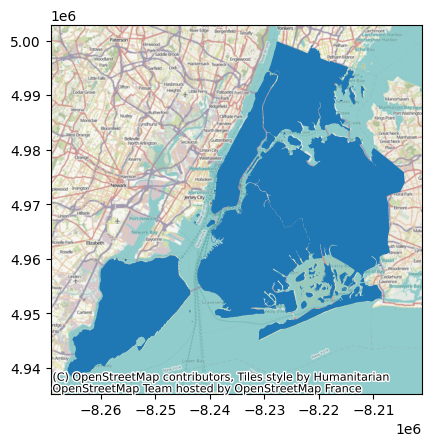

In [11]:
ax = db_wm.plot()
cx.add_basemap(ax);

## Option 2: Warp the tiles

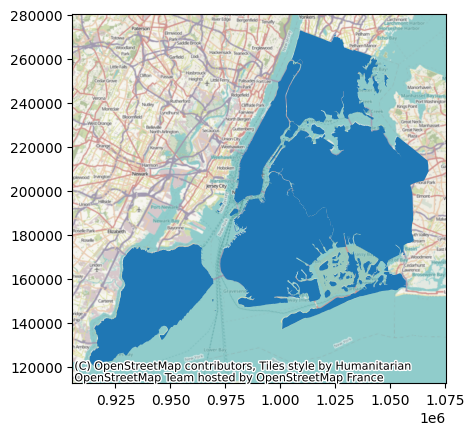

In [12]:
ax = db.plot()
cx.add_basemap(ax, crs=db.crs);

## Convert your data and warp the tiles

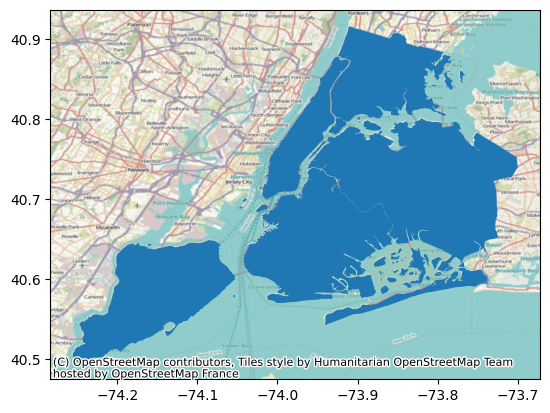

In [13]:
db_lonlat = db.to_crs(epsg=4326)
ax = db_lonlat.plot()
cx.add_basemap(ax, crs=db_lonlat.crs);

## Warping from local files

In [14]:
w, s, e, n = db_wm.total_bounds

img, ext = cx.bounds2raster(w, s, e, n,
                            drive_path + 'warp_tst.tif',
                            zoom=10)

In [15]:
with rio.open(drive_path + 'warp_tst.tif') as r:
    print(r.crs)

EPSG:3857


In [16]:
db.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

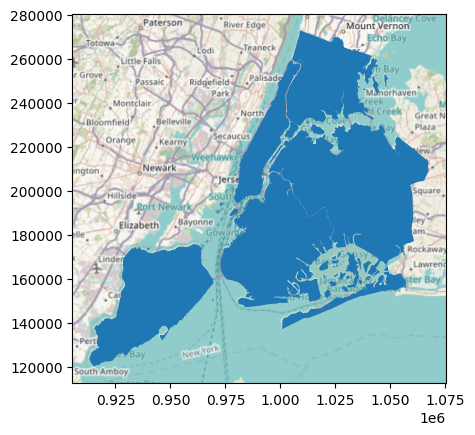

In [17]:
ax = db.plot()
cx.add_basemap(ax,
               source=drive_path + 'warp_tst.tif',
               crs=db.crs);

## Low-level warping functionality

- most of the time, warping with `add_basemap` will suffice, but `contextily` includes 2 other functions:
    1. `warp_img_transform`
    2. `warp_tiles`

### `warp_tiles`

- allows you to warp an image provided you have it's extent and CRS

In [18]:
db.to_crs(epsg=3857).total_bounds

array([-8266094.6190995 ,  4938300.50624433, -8204247.48044979,
        4999890.73949276])

In [19]:
# this is just to test my understanding of total_bounds
minX, minY, maxX, maxY = db.to_crs(epsg=3857).geometry[0].bounds
for geom in db.to_crs(epsg=3857).geometry:
    x1, y1, x2, y2 = geom.bounds
    if x1 < minX : minX = x1
    if y1 < minY : minY = y1
    if x2 > maxX : maxX = x2
    if y2 > maxY : maxY = y2

np.array([minX, minY, maxX, maxY]) - db.to_crs(epsg=3857).total_bounds

array([0., 0., 0., 0.])

In [20]:
# extract bounding box in Web Mercator
w, s, e, n = db.to_crs(epsg=3857).total_bounds

img, ext = cx.bounds2img(w, s, e, n)
ext

(-8277212.918945165, -8198941.401981145, 4931105.568733288, 5009377.08569731)

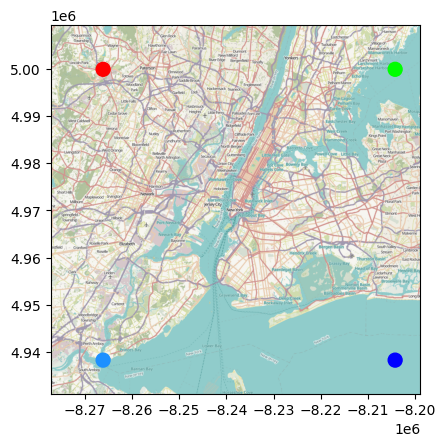

In [21]:
plt.imshow(img, extent=ext)
plt.scatter([w, e, w, e], [n, n, s, s], c=['red', 'lime', 'dodgerblue', 'blue'], s=100)
plt.show()

- above is in Web Mercator
- below we do it in lon/lat using `warp_tiles`

In [22]:
warped_img, warped_ext = cx.warp_tiles(img, ext, 'epsg:4326')
warped_ext

(-74.3558120727539, -73.65274354305068, 40.44706803396216, 40.980157257090696)

In [23]:
db.to_crs(epsg=4326).total_bounds

array([-74.25559136,  40.4961154 , -73.70000906,  40.91553278])

In [24]:
minX, minY, maxX, maxY = db.to_crs(epsg=4326).total_bounds

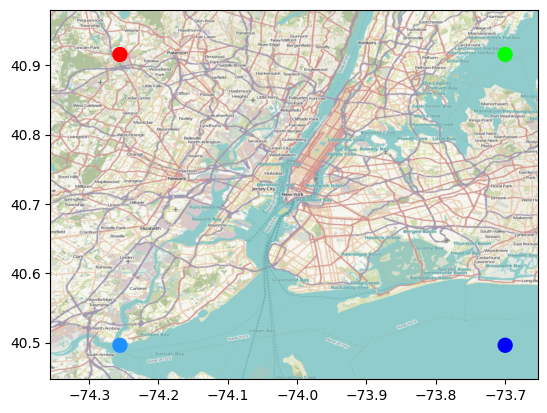

In [25]:
plt.imshow(warped_img, extent=warped_ext)
plt.scatter([minX, maxX, minX, maxX], [maxY, maxY, minY, minY],
            c=['red', 'lime', 'dodgerblue', 'blue'], s=100);

### `warp_img_transform`

- allows you to warp an image you have loaded from disk, provided you have it's transform and CRS

In [26]:
src = rio.open(drive_path + 'warp_tst.tif')
src

<open DatasetReader name='/content/gdrive/MyDrive/Colab Notebooks/Data Science/Applied Geospatial Data Science with Python - Book/data/warp_tst.tif' mode='r'>

In [27]:
img = src.read()

In [28]:
img

array([[[172, 172, 185, ..., 144, 144, 144],
        [182, 178, 199, ..., 144, 144, 144],
        [185, 199, 185, ..., 144, 144, 144],
        ...,
        [236, 236, 236, ..., 144, 144, 144],
        [234, 247, 247, ..., 144, 144, 144],
        [244, 238, 244, ..., 144, 144, 144]],

       [[189, 189, 196, ..., 204, 204, 204],
        [187, 194, 184, ..., 204, 204, 204],
        [196, 184, 196, ..., 204, 204, 204],
        ...,
        [240, 240, 240, ..., 204, 204, 204],
        [236, 246, 246, ..., 204, 204, 204],
        [243, 241, 243, ..., 204, 204, 204]],

       [[150, 150, 163, ..., 203, 203, 203],
        [154, 157, 166, ..., 203, 203, 203],
        [163, 166, 163, ..., 203, 203, 203],
        ...,
        [222, 222, 222, ..., 203, 203, 203],
        [221, 241, 241, ..., 203, 203, 203],
        [236, 231, 236, ..., 203, 203, 203]],

       [[255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        [255, 255, 255, ..., 255, 255, 255],
        ..

In [29]:
src.transform

Affine(152.87405657035197, 0.0, -8296857.235214456,
       0.0, -152.8740565703556, 5009453.522725595)

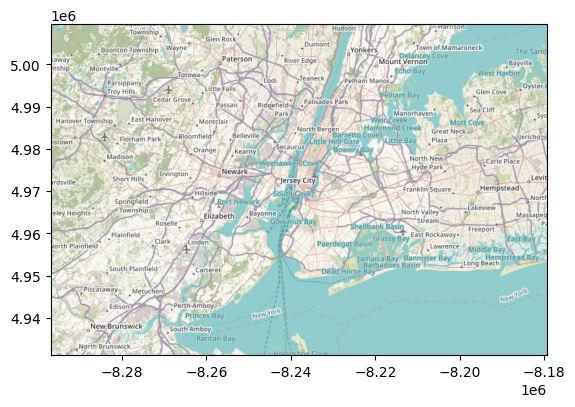

In [30]:
rioshow(img, transform=src.transform);

- Next, we take this into NAD83 using `warp_img_transform`

In [31]:
db.crs

<Projected CRS: EPSG:2263>
Name: NAD83 / New York Long Island (ftUS)
Axis Info [cartesian]:
- X[east]: Easting (US survey foot)
- Y[north]: Northing (US survey foot)
Area of Use:
- name: United States (USA) - New York - counties of Bronx; Kings; Nassau; New York; Queens; Richmond; Suffolk.
- bounds: (-74.26, 40.47, -71.8, 41.3)
Coordinate Operation:
- name: SPCS83 New York Long Island zone (US Survey feet)
- method: Lambert Conic Conformal (2SP)
Datum: North American Datum 1983
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [32]:
src.crs

CRS.from_epsg(3857)

In [33]:
w_img, w_transform = cx.warp_img_transform(img,
                                           src.transform,
                                           src.crs,
                                           db.crs)

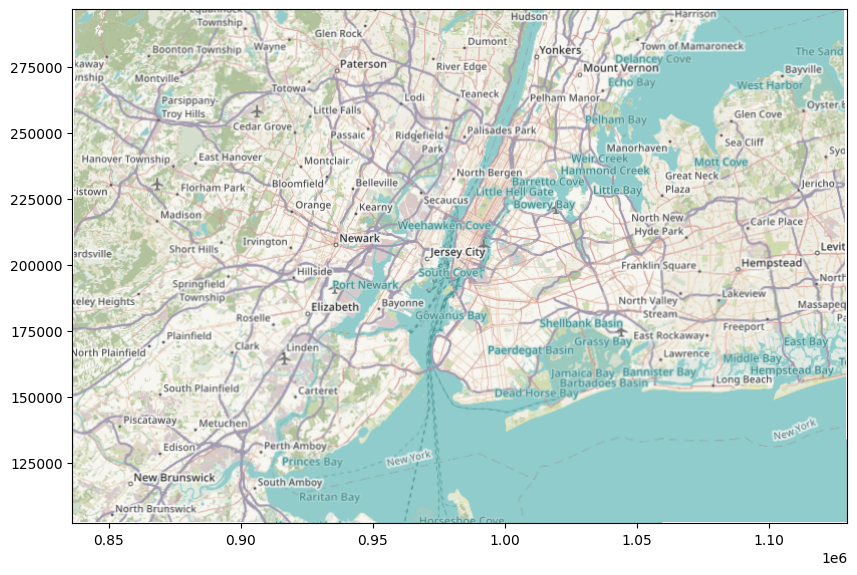

In [34]:
f, ax = plt.subplots(1, figsize=(10, 10))
rioshow(w_img, transform=w_transform, ax=ax);